# Gaussian Pitch Control (First 5 Events) — Clean Notebook

This notebook:
- Downloads match data from Supabase view `vw_voronoi_window_cr_sh_with_ball` for `MATCH_ID=10502`
- Builds Gaussian pitch-control (home probability) with cutoff patch optimization
- Masks "no control" areas as white
- Animates the **first 5 events** back-to-back (2.5s before + 2.5s after each event), with players + ball

**Prereqs**
- Set environment variables `SUPABASE_URL` and `SUPABASE_KEY` (anon/service role with read access)


In [4]:
!pip -q install supabase

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

from supabase import create_client

os.environ["SUPABASE_URL"] = 'https://cctasilkmirgtrvapggo.supabase.co'
os.environ["SUPABASE_KEY"] = 'sb_publishable_UYXQq0vwcwZl659NJf_s2w_qZ-kb8Rw'
SUPABASE_URL = os.getenv("SUPABASE_URL")
SUPABASE_KEY = os.getenv("SUPABASE_KEY")
if not SUPABASE_URL or not SUPABASE_KEY:
    raise ValueError("Please set SUPABASE_URL and SUPABASE_KEY in your environment before running.")

supabase = create_client(SUPABASE_URL, SUPABASE_KEY)
print("Supabase client ready.")

Supabase client ready.


In [5]:
# --- Fetch a single match from the with-ball view (paginated) ---

def fetch_all_filtered_cols(view_name: str, match_id: int, cols: str, page_size: int = 1000) -> pd.DataFrame:
    rows = []
    start = 0
    while True:
        resp = (
            supabase.table(view_name)
            .select(cols)
            .eq("match_id", match_id)
            .range(start, start + page_size - 1)
            .execute()
        )
        batch = resp.data or []
        rows.extend(batch)
        if len(batch) < page_size:
            break
        start += page_size
    return pd.DataFrame(rows)

MATCH_ID = 10502
VIEW_NAME = "vw_voronoi_window_cr_sh_with_ball"

# NOTE: side_norm is NOT in this view — we'll derive it from side in Python.
COLS = "match_id,game_event_id,possession_event_id,possession_event_type,event_time_ms,frame_num,video_time_ms,side,jersey_num,x,y,visibility,ball_x,ball_y,ball_z"

df_game = fetch_all_filtered_cols(VIEW_NAME, MATCH_ID, COLS, page_size=1000)

out_csv = f"{VIEW_NAME}_match_{MATCH_ID}.csv"
df_game.to_csv(out_csv, index=False)

print("df_game shape:", df_game.shape)
print("unique game_event_id:", df_game['game_event_id'].nunique())
print("ball non-null rates:", df_game[['ball_x','ball_y']].notna().mean().to_dict())
print("saved:", os.path.abspath(out_csv))

df_game shape: (76582, 15)
unique game_event_id: 70
ball non-null rates: {'ball_x': 0.8695777075553002, 'ball_y': 0.8695777075553002}
saved: /Users/gabrielito/vw_voronoi_window_cr_sh_with_ball_match_10502.csv


In [6]:
# --- Event slicing helpers (event_uid + rel_ms), and side normalization ---

def norm_side(v):
    s = str(v).strip().lower()
    if ("home" in s) or (s in {"h", "1"}):
        return "home"
    if ("away" in s) or (s in {"a", "2"}):
        return "away"
    return np.nan

def add_event_uid_and_rel_ms(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    for c in ["event_time_ms", "video_time_ms", "x", "y"]:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors="coerce")

    if "possession_event_type" in df.columns:
        df["possession_event_type"] = df["possession_event_type"].astype(str).str.upper()
    else:
        df["possession_event_type"] = "UNKNOWN"

    if "side_norm" not in df.columns:
        if "side" in df.columns:
            df["side_norm"] = df["side"].map(norm_side)
        else:
            raise ValueError("Need `side` column to derive side_norm")

    df = df.dropna(subset=["side_norm", "video_time_ms"]).copy()

    df["event_uid"] = (
        df["possession_event_type"].astype(str) + "_" +
        df["game_event_id"].astype(str) + "_" +
        df["event_time_ms"].round().astype("int64").astype(str)
    )

    df["rel_ms"] = df["video_time_ms"] - df["event_time_ms"]
    return df

def slice_event_window(df: pd.DataFrame, event_uid: str, t_before_s: float, t_after_s: float) -> pd.DataFrame:
    w = df[df["event_uid"] == event_uid].copy()
    if w.empty:
        return w
    lo = -1000.0 * float(t_before_s)
    hi =  1000.0 * float(t_after_s)
    w = w[(w["rel_ms"] >= lo) & (w["rel_ms"] <= hi)].copy()
    w = w.sort_values(["video_time_ms", "frame_num"] if "frame_num" in w.columns else ["video_time_ms"])
    return w

df_game = add_event_uid_and_rel_ms(df_game)
print("unique event_uid:", df_game['event_uid'].nunique())

unique event_uid: 70


In [7]:
# --- Gaussian model: params + grid ---
from dataclasses import dataclass, asdict
from typing import Tuple
import hashlib, json

@dataclass(frozen=True)
class InfluenceParams:
    pitch_length: float = 105.0
    pitch_width: float = 68.0
    nx: int = 106
    ny: int = 68
    eps: float = 1e-6

    fps: float = 10.0
    smooth_vel_window_s: float = 0.5
    max_speed: float = 13.0

    base_sigma: float = 2.0
    sigma_lat_mult: float = 0.8
    sigma_scale_by_speed: float = 0.12
    min_speed_for_aniso: float = 0.3

    n_sigma_cutoff: float = 3.0
    min_cutoff_m: float = 6.0

    def hash(self) -> str:
        payload = json.dumps(asdict(self), sort_keys=True).encode("utf-8")
        return hashlib.md5(payload).hexdigest()

class Grid2D:
    def __init__(self, params: InfluenceParams):
        self.params = params
        L, W = params.pitch_length, params.pitch_width
        self.xc = np.linspace(-L/2, L/2, params.nx, dtype=np.float32)
        self.yc = np.linspace(-W/2, W/2, params.ny, dtype=np.float32)
        self.gx, self.gy = np.meshgrid(self.xc, self.yc)
        self.gx = self.gx.astype(np.float32, copy=False)
        self.gy = self.gy.astype(np.float32, copy=False)

    @property
    def shape(self) -> Tuple[int, int]:
        return (self.params.ny, self.params.nx)

params = InfluenceParams(fps=10.0, nx=106, ny=68, base_sigma=2.0)
grid = Grid2D(params)
print("Grid:", grid.shape)

Grid: (68, 106)


In [8]:
# --- Velocity smoothing (robust) ---
def ensure_smoothed_velocity(
    tracking: pd.DataFrame,
    params: InfluenceParams,
    player_id_col: str = "player_id",
    frame_col: str = "frame_num",
    time_ms_col: str = "video_time_ms",
    x_col: str = "x",
    y_col: str = "y",
    vx_col: str = "vx",
    vy_col: str = "vy",
) -> pd.DataFrame:
    df = tracking.copy()
    w = max(1, int(round(params.smooth_vel_window_s * params.fps)))

    sort_cols = [player_id_col]
    sort_cols.append(frame_col if frame_col in df.columns else time_ms_col)
    df = df.sort_values(sort_cols).copy()

    has_v = (vx_col in df.columns) and (vy_col in df.columns)
    if not has_v:
        dt = df.groupby(player_id_col)[time_ms_col].diff() / 1000.0
        dt = dt.replace([0, np.inf, -np.inf], np.nan)
        dx = df.groupby(player_id_col)[x_col].diff()
        dy = df.groupby(player_id_col)[y_col].diff()
        df[vx_col] = dx / dt
        df[vy_col] = dy / dt

    df[vx_col] = (
        df.groupby(player_id_col)[vx_col]
        .rolling(window=w, min_periods=1)
        .mean()
        .reset_index(level=0, drop=True)
    )
    df[vy_col] = (
        df.groupby(player_id_col)[vy_col]
        .rolling(window=w, min_periods=1)
        .mean()
        .reset_index(level=0, drop=True)
    )

    df[vx_col] = pd.to_numeric(df[vx_col], errors="coerce")
    df[vy_col] = pd.to_numeric(df[vy_col], errors="coerce")
    df.loc[~np.isfinite(df[vx_col]), vx_col] = np.nan
    df.loc[~np.isfinite(df[vy_col]), vy_col] = np.nan

    speed = np.sqrt(df[vx_col]**2 + df[vy_col]**2)
    cap = params.max_speed
    scale = np.minimum(1.0, cap / (speed + 1e-12))
    df[vx_col] = df[vx_col] * scale
    df[vy_col] = df[vy_col] * scale

    return df

In [9]:
# --- Influence math (vectorized + cutoff patches) ---
from typing import Tuple

def _sigma_from_speed(speed: float, params: InfluenceParams) -> Tuple[float, float, bool]:
    base = params.base_sigma
    s_long = base + params.sigma_scale_by_speed * float(speed)
    s_lat = base * params.sigma_lat_mult
    use_aniso = (np.isfinite(speed) and speed >= params.min_speed_for_aniso)
    return float(s_long), float(s_lat), bool(use_aniso)

def _patch_bounds_indices(grid: Grid2D, x: float, y: float, radius: float) -> Tuple[int, int, int, int]:
    x0, x1 = x - radius, x + radius
    y0, y1 = y - radius, y + radius
    j0 = int(np.searchsorted(grid.xc, x0, side="left"))
    j1 = int(np.searchsorted(grid.xc, x1, side="right"))
    i0 = int(np.searchsorted(grid.yc, y0, side="left"))
    i1 = int(np.searchsorted(grid.yc, y1, side="right"))
    j0 = max(0, min(j0, grid.params.nx))
    j1 = max(0, min(j1, grid.params.nx))
    i0 = max(0, min(i0, grid.params.ny))
    i1 = max(0, min(i1, grid.params.ny))
    return i0, i1, j0, j1

def _add_player_influence_to_surface(
    surface: np.ndarray,
    grid: Grid2D,
    px: float, py: float,
    vx: float, vy: float,
    params: InfluenceParams,
) -> None:
    if not (np.isfinite(px) and np.isfinite(py)):
        return

    if np.isfinite(vx) and np.isfinite(vy):
        speed = float(np.sqrt(vx*vx + vy*vy))
    else:
        speed = 0.0

    s_long, s_lat, use_aniso = _sigma_from_speed(speed, params)

    radius = max(params.min_cutoff_m, params.n_sigma_cutoff * max(s_long, s_lat))
    i0, i1, j0, j1 = _patch_bounds_indices(grid, px, py, radius)
    if (i1 - i0) <= 0 or (j1 - j0) <= 0:
        return

    gx = grid.gx[i0:i1, j0:j1]
    gy = grid.gy[i0:i1, j0:j1]
    dx = gx - np.float32(px)
    dy = gy - np.float32(py)

    if use_aniso and np.isfinite(vx) and np.isfinite(vy):
        ang = float(np.arctan2(vy, vx))
        c = np.float32(np.cos(ang))
        s = np.float32(np.sin(ang))
        u =  c * dx + s * dy
        v = -s * dx + c * dy
        inv_s2_long = np.float32(1.0 / (s_long * s_long + 1e-12))
        inv_s2_lat  = np.float32(1.0 / (s_lat  * s_lat  + 1e-12))
        mahal = (u*u) * inv_s2_long + (v*v) * inv_s2_lat
    else:
        inv_s2 = np.float32(1.0 / (params.base_sigma * params.base_sigma + 1e-12))
        mahal = (dx*dx + dy*dy) * inv_s2

    surface[i0:i1, j0:j1] += np.exp(-0.5 * mahal).astype(np.float32)

In [10]:
# --- Pitch control (returns P_home + total influence for masking) ---
def compute_pitch_control_return_total(
    frames_df: pd.DataFrame,
    grid: Grid2D,
    params: InfluenceParams,
    frame_col: str = "frame_num",
    team_col: str = "side_norm",
    player_id_col: str = "player_id",
    x_col: str = "x",
    y_col: str = "y",
    vx_col: str = "vx",
    vy_col: str = "vy",
):
    df = frames_df.copy()
    df[x_col] = pd.to_numeric(df[x_col], errors="coerce")
    df[y_col] = pd.to_numeric(df[y_col], errors="coerce")

    df = ensure_smoothed_velocity(
        df, params,
        player_id_col=player_id_col,
        frame_col=frame_col,
        time_ms_col="video_time_ms",
        x_col=x_col, y_col=y_col,
        vx_col=vx_col, vy_col=vy_col,
    )

    frame_ids = df[frame_col].dropna().astype(int).sort_values().unique()
    T = len(frame_ids)
    ny, nx = grid.shape

    P = np.empty((T, ny, nx), dtype=np.float32)
    TOT = np.empty((T, ny, nx), dtype=np.float32)

    for t, fid in enumerate(frame_ids):
        f = df[df[frame_col] == fid]
        H = np.zeros((ny, nx), dtype=np.float32)
        A = np.zeros((ny, nx), dtype=np.float32)

        for row in f.itertuples(index=False):
            team = getattr(row, team_col)
            px = getattr(row, x_col)
            py = getattr(row, y_col)
            vx = getattr(row, vx_col)
            vy = getattr(row, vy_col)

            if not (np.isfinite(px) and np.isfinite(py)):
                continue

            if team == "home":
                _add_player_influence_to_surface(H, grid, float(px), float(py), float(vx), float(vy), params)
            elif team == "away":
                _add_player_influence_to_surface(A, grid, float(px), float(py), float(vx), float(vy), params)

        total = H + A
        TOT[t] = total
        P[t] = H / (total + np.float32(params.eps))

    return P, TOT, frame_ids

First 5 events:
1 CR_6629857_302769 | type: CR | game_event_id: 6629857 | event_time_ms: 302769
2 SH_6629878_309710 | type: SH | game_event_id: 6629878 | event_time_ms: 309710
3 CR_6630167_465499 | type: CR | game_event_id: 6630167 | event_time_ms: 465499
4 CR_6630328_587921 | type: CR | game_event_id: 6630328 | event_time_ms: 587921
5 CR_6630374_633233 | type: CR | game_event_id: 6630374 | event_time_ms: 633233
[1] frames=49 | rel_ms=(-2402,2403)
[2] frames=50 | rel_ms=(-2436,2469)
[3] frames=50 | rel_ms=(-2469,2436)
[4] frames=50 | rel_ms=(-2469,2436)
[5] frames=50 | rel_ms=(-2436,2469)
Total stitched frames: 274


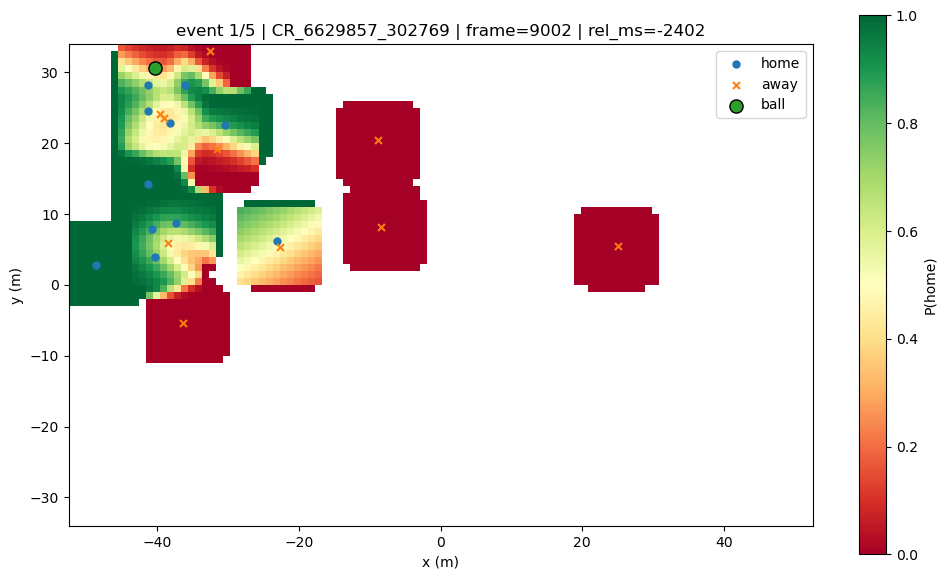

In [11]:
# --- Stitch and animate the FIRST 5 EVENTS back-to-back (2.5s pre + 2.5s post) ---

events = (
    df_game[["event_uid", "event_time_ms", "possession_event_type", "game_event_id"]]
    .dropna(subset=["event_uid", "event_time_ms"])
    .drop_duplicates(subset=["event_uid"])
    .sort_values("event_time_ms")
)
first5_event_uids = events["event_uid"].head(5).tolist()

print("First 5 events:")
for i, eu in enumerate(first5_event_uids, 1):
    row = events.loc[events["event_uid"] == eu].iloc[0]
    print(i, eu, "| type:", row["possession_event_type"], "| game_event_id:", row["game_event_id"], "| event_time_ms:", row["event_time_ms"])

results = []
for i, eu in enumerate(first5_event_uids, 1):
    win = slice_event_window(df_game, eu, t_before_s=2.5, t_after_s=2.5).copy()
    win["player_id"] = win["side_norm"].astype(str) + "_" + win["jersey_num"].astype(str)

    P_home, total_inf, _ = compute_pitch_control_return_total(win, grid, params)
    frames_in_win = np.sort(win["frame_num"].unique())

    print(f"[{i}] frames={len(frames_in_win)} | rel_ms=({win['rel_ms'].min():.0f},{win['rel_ms'].max():.0f})")

    results.append({
        "event_uid": eu,
        "win": win,
        "P_home": P_home,
        "total_inf": total_inf,
        "frames_in_win": frames_in_win
    })

GAP_FRAMES = 5
MASK_THRESH = 1e-3
INTERVAL_MS = 100

timeline = []
for e_idx, r in enumerate(results):
    T = r["P_home"].shape[0]
    timeline.extend([(e_idx, t) for t in range(T)])
    timeline.extend([(-1, -1)] * GAP_FRAMES)

print("Total stitched frames:", len(timeline))

cmap = plt.cm.RdYlGn.copy()
cmap.set_bad(color="white")

extent = [grid.xc.min(), grid.xc.max(), grid.yc.min(), grid.yc.max()]

fig, ax = plt.subplots(figsize=(12, 7), facecolor="white")
ax.set_facecolor("white")

first_e, first_t = next((et for et in timeline if et[0] != -1), (0, 0))
P0 = results[first_e]["P_home"][first_t]
T0 = results[first_e]["total_inf"][first_t]
Pm0 = np.ma.array(P0, mask=(T0 < MASK_THRESH))

im = ax.imshow(Pm0, origin="lower", extent=extent, vmin=0, vmax=1, cmap=cmap)
fig.colorbar(im, ax=ax, label="P(home)")

ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")
title = ax.set_title("")

home_sc = ax.scatter([], [], s=25, marker="o", label="home")
away_sc = ax.scatter([], [], s=25, marker="x", label="away")
ball_sc = ax.scatter([], [], s=90, marker="o", edgecolors="black", label="ball")
ax.legend(loc="upper right")

def update(global_t):
    e_idx, t = timeline[global_t]

    if e_idx == -1:
        blank = np.ma.array(np.zeros(grid.shape, dtype=np.float32), mask=np.ones(grid.shape, dtype=bool))
        im.set_data(blank)
        home_sc.set_offsets(np.empty((0, 2)))
        away_sc.set_offsets(np.empty((0, 2)))
        ball_sc.set_offsets(np.empty((0, 2)))
        title.set_text("transition…")
        return im, home_sc, away_sc, ball_sc, title

    r = results[e_idx]
    win = r["win"]
    frames_in_win = r["frames_in_win"]

    fid = frames_in_win[t]
    f = win[win["frame_num"] == fid]

    P = r["P_home"][t]
    Tot = r["total_inf"][t]
    im.set_data(np.ma.array(P, mask=(Tot < MASK_THRESH)))

    home = f[f["side_norm"] == "home"]
    away = f[f["side_norm"] == "away"]
    home_sc.set_offsets(np.c_[home["x"].values, home["y"].values])
    away_sc.set_offsets(np.c_[away["x"].values, away["y"].values])

    bx = f["ball_x"].dropna() if "ball_x" in f.columns else pd.Series(dtype=float)
    by = f["ball_y"].dropna() if "ball_y" in f.columns else pd.Series(dtype=float)
    if len(bx) and len(by):
        ball_sc.set_offsets(np.c_[[bx.iloc[0]], [by.iloc[0]]])
    else:
        ball_sc.set_offsets(np.empty((0, 2)))

    rel = f["rel_ms"].iloc[0] if "rel_ms" in f.columns and len(f) else np.nan
    title.set_text(f"event {e_idx+1}/5 | {r['event_uid']} | frame={fid} | rel_ms={rel:.0f}")

    return im, home_sc, away_sc, ball_sc, title

ani = animation.FuncAnimation(fig, update, frames=len(timeline), interval=INTERVAL_MS, blit=False)
HTML(ani.to_jshtml())